### Santander Value Prediction

Problem Statement: Santander Group wants to identify the value of transactions for each potential customer.


<b>Introduction:</b> The purpose of this kernel is to walkthrough different dataset decomposition techniques and their implementation.

In this competition, Santander Group is asking Kagglers to help them identify the value of transactions for each potential customer. This is a first step that Santander needs to nail in order to personalize their services at scale.





### Import Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot


from sklearn.preprocessing import StandardScaler  #Standardization

from sklearn.decomposition import PCA,TruncatedSVD,FastICA,FactorAnalysis,NMF

from sklearn.random_projection import GaussianRandomProjection,SparseRandomProjection

from sklearn.manifold import TSNE



In [2]:
train = pd.read_csv('../../Dataset/train_santander.csv')
target = train['target']
train = train.drop(['target','ID'],axis=1)

In [3]:
train.shape

(4459, 4991)

<b>Observation:</b> It's a high dimensional data with 4459 rows and 4993 columns. 

In [4]:
train.head()

,48df886f9,0deb4b6a8,34b15f335,a8cb14b00,2f0771a37,30347e683,d08d1fbe3,6ee66e115,20aa07010,dc5a8f1d8,...,3ecc09859,9281abeea,8675bec0b,3a13ed79a,f677d4d13,71b203550,137efaa80,fb36b89d9,7e293fbaf,9fc776466
0,0.0,0,0.0,0,0,0,0,0,0.0,0.0,...,0.0,0.0,0.0,0,0,0,0,0,0,0
1,0.0,0,0.0,0,0,0,0,0,2200000.0,0.0,...,0.0,0.0,0.0,0,0,0,0,0,0,0
2,0.0,0,0.0,0,0,0,0,0,0.0,0.0,...,0.0,0.0,0.0,0,0,0,0,0,0,0
3,0.0,0,0.0,0,0,0,0,0,0.0,0.0,...,0.0,0.0,0.0,0,0,0,0,0,0,0
4,0.0,0,0.0,0,0,0,0,0,2000000.0,0.0,...,0.0,0.0,0.0,0,0,0,0,0,0,0


#### Statistical Data

In [5]:
col_df = train.describe().T
col_df = col_df.reset_index().rename(columns={'index':'columns'})
col_df['unique'] = col_df['columns'].apply(lambda x:len(train[x].value_counts()))
col_df['mean'] = col_df['columns'].apply(lambda x: np.mean(train[x]))
col_df['var'] = col_df['columns'].apply(lambda x:np.var(train[x]))
col_df['std'] =col_df['columns'].apply(lambda x:np.std(train[x]))
col_df['target_corr'] = col_df['columns'].apply(lambda x:np.corrcoef(target,train[x])[0][1])
col_df.head()

,columns,count,mean,std,min,25%,50%,75%,max,unique,var,target_corr
0,48df886f9,4459.0,14654.930101,3.892862e+05,0.0,0.0,0.0,0.0,20000000.0,32,1.515437e+11,0.010188
1,0deb4b6a8,4459.0,1390.894819,6.427582e+04,0.0,0.0,0.0,0.0,4000000.0,5,4.131381e+09,0.013805
2,34b15f335,4459.0,26722.450922,5.699013e+05,0.0,0.0,0.0,0.0,20000000.0,29,3.247875e+11,0.014694
3,a8cb14b00,4459.0,4530.163714,2.358860e+05,0.0,0.0,0.0,0.0,14800000.0,3,5.564218e+10,-0.002917
4,2f0771a37,4459.0,26409.957390,1.514560e+06,0.0,0.0,0.0,0.0,100000000.0,6,2.293893e+12,0.016647


#### Standardization :
    
    This will be done to normalize the data so as to put them into same scale. We will use Standard Scaler method to scale the data.
    
    Standardization: StandardScaler standardizes a feature by subtracting the mean and then scaling to unit variance.
    

In [6]:
sc = StandardScaler()
train_sc = sc.fit_transform(train.values)
train_sc

array([[-0.03764565, -0.02163947, -0.04688961, ..., -0.07234203,
        -0.05636327, -0.12585201],
       [-0.03764565, -0.02163947, -0.04688961, ..., -0.07234203,
        -0.05636327, -0.12585201],
       [-0.03764565, -0.02163947, -0.04688961, ..., -0.07234203,
        -0.05636327, -0.12585201],
       ...,
       [-0.03764565, -0.02163947, -0.04688961, ..., -0.07234203,
        -0.05636327, -0.12585201],
       [-0.03764565, -0.02163947, -0.04688961, ..., -0.07234203,
        -0.05636327, -0.12585201],
       [-0.03764565, -0.02163947, -0.04688961, ..., -0.07234203,
        -0.05636327, -0.12585201]])

#### Variable Variance :


    Let's try to find the variable variance which are float type and 0.



In [7]:
var_0 = col_df[col_df['var'].astype('float')==0.0]
var_0.head()

,columns,count,mean,std,min,25%,50%,75%,max,unique,var,target_corr
26,d5308d8bc,4459.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0.0,NaN
33,c330f1a67,4459.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0.0,NaN
36,eeac16933,4459.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0.0,NaN
57,7df8788e8,4459.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0.0,NaN
68,5b91580ee,4459.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0.0,NaN


In [8]:
print('Number of column consisting 0 variance is : ',len(var_0))

Number of column consisting 0 variance is :  256


### Pearson Correlation:
    
    Pearson Correlation measures the statistical measures between two continous variables.

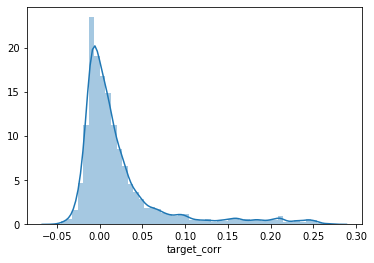

In [9]:
import seaborn as sns

sns.distplot(col_df['target_corr'])

C:\Users\subhr\Anaconda3\lib\site-packages\numpy\lib\histograms.py:839: RuntimeWarning:

invalid value encountered in greater_equal

C:\Users\subhr\Anaconda3\lib\site-packages\numpy\lib\histograms.py:840: RuntimeWarning:

invalid value encountered in less_equal



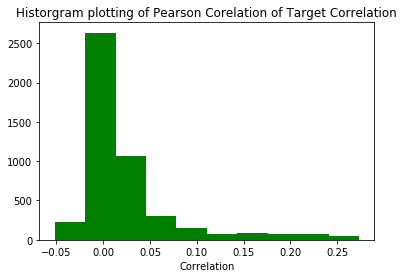

In [10]:
plt.hist(col_df['target_corr'],color='green',)
plt.title('Historgram plotting of Pearson Corelation of Target Correlation')
plt.xlabel('Correlation')
plt.show()

### Decomposition into Eigenvectors and EigenValues

<b>Covariance Matrix:</b> 

In probability theory and statistics, a covariance matrix (also known as auto-covariance matrix, dispersion matrix, variance matrix, or variance–covariance matrix) is a square matrix giving the covariance between each pair of elements of a given random vector.

<b>Eigen Values & Eigen Vector</b>:
In linear algebra, an eigenvector or characteristic vector of a linear transformation is a nonzero vector that changes at most by a scalar factor when that linear transformation is applied to it.The corresponding eigenvalue is the factor by which the eigenvector is scaled.

In [11]:
#Eigen Value Creation
mean_vec = np.mean(train_sc,axis=0)
cov_matrix = np.cov(train_sc.T)
eig_val,eig_vect = np.linalg.eig(cov_matrix)

#Creating a list of Eigen value and Eigen vectors

eig_pairs = [(np.abs(eig_val[i]),eig_vect[:,i]) for i in range(len(eig_val))]

#sort the eigen pairs from low to high 
eig_pairs.sort(key=lambda x:x[0],reverse=True)

#Calculating explained variance from eigenvaues

tot = sum(eig_val)

#Individual variance

var_exp = [(i/tot)*100 for i in sorted(eig_val,reverse=True)]
var_exp_real = np.real(var_exp)

# Cumulative explained variance
cum_var_exp = np.cumsum(var_exp) 
cum_exp_real = [v.real for v in cum_var_exp]



# plot the variance and cumulative variance 
trace1 = go.Scatter(x=train.columns, y=var_exp_real, name="Individual Variance", opacity=0.75, marker=dict(color="red"))
trace2 = go.Scatter(x=train.columns, y=cum_exp_real, name="Cumulative Variance", opacity=0.75, marker=dict(color="blue"))
layout = dict(height=400, title='Variance Explained by Variables', legend=dict(orientation="h", x=0, y=1.2));
fig = go.Figure(data=[trace1, trace2], layout=layout);
iplot(fig);

### PCA(Principle Component Analysis)

<b>Finding the correct number of components</b>

In [12]:
def _get_no_components(model,threshold):
    
    component_variance = model.explained_variance_ratio_
    explained_variance=0.0
    components = 0
    
    for var in component_variance:
        explained_variance+=var
        components+=1
        if(explained_variance>threshold):
            break
    return components


#Get the optimal number of components
pca = PCA()
train_pca = pca.fit_transform(train_sc)
components = _get_no_components(pca,threshold=0.85)
components




    

993

#### So with 85% of threshold we can get 993 components. These components will explain the 85% of variance in the dataset.

### Visualizing Scatter Plots

In [13]:
def plot_3_components(x_trans, title):
    trace = go.Scatter3d(x=x_trans[:,0], y=x_trans[:,1], z = x_trans[:,2],
                          name = str(target), mode = 'markers', text = target, showlegend = False,
                          marker = dict(size = 8, color=x_trans[:,1], 
                          line = dict(width = 1, color = '#f7f4f4'), opacity = 0.5))
    layout = go.Layout(title = title, showlegend= True)
    fig = dict(data=[trace], layout=layout)
    iplot(fig)

def plot_2_components(x_trans, title):
    trace = go.Scatter(x=x_trans[:,0], y=x_trans[:,1], name=str(target), mode='markers',
        text = target, showlegend = False,
        marker = dict(size = 8, color=x_trans[:,1], line = dict(width = 1, color = '#fefefe'), opacity = 0.7))
    layout = go.Layout(title = title, hovermode= 'closest',
        xaxis= dict(title= 'First Component',
            ticklen = 5, zeroline= False, gridwidth= 2),
        yaxis=dict(title= 'Second Component',
            ticklen = 5, gridwidth = 2), showlegend= True)
    fig = dict(data=[trace], layout=layout)
    iplot(fig)
    
    z = x_trans[:,2]


### Applying PCA

In [14]:
### Implement PCA 
obj_pca = model = PCA(n_components = components)
X_pca = obj_pca.fit_transform(train_sc)

## Visualize the Components 
plot_3_components(X_pca, 'PCA - First Three Component')
plot_2_components(X_pca, 'PCA - First Two Components')




In [15]:
obj_stvd = TruncatedSVD(n_components=components)
X_tsvd = obj_stvd.fit_transform(train_sc)

plot_3_components(X_tsvd,'Truncated SVD with 3 components')
plot_2_components(X_tsvd,'Truncated SVD with 2 Components')
    

#### Independent Component Analysis

In [16]:
obj_Ica = FastICA(n_components=30
                 )
X_ica = obj_Ica.fit_transform(train_sc)

plot_3_components(X_ica,'Plot with 3 Components')
plot_2_components(X_ica,'Plot with 2 Components')

### Factor Analysis:
    
    Factor analysis is a technique to reduce the number of attributes when the relationships between those attributes are not that obvious. Essentially, Factor analysis analyzes interrelationships (or correlations) among a large number of items and reduces the large number of these items into smaller sets of factors.

In [17]:
obj_fca = FactorAnalysis(n_components=30)
X_fca = obj_fca.fit_transform(train_sc)

plot_3_components(X_fca,'Plot with 3 Components')
plot_2_components(X_fca,'Plot with 2 Components')

### Non Negative Matrix Factorization:
    
    Non-negative matrix factorization (NMF or NNMF), also non-negative matrix approximation is a group of algorithms in multivariate analysis and linear algebra where a matrix V is factorized into (usually) two matrices W and H, with the property that all three matrices have no negative elements.

In [18]:
obj_nmf = NMF(n_components=30)
X_nmf = obj_nmf.fit_transform(train)

plot_3_components(X_nmf,'Plot 3 Components')
plot_2_components(X_nmf,'Plot 2 Components')

### Gaussian Random Projection:
    
    The sklearn.random_projection.GaussianRandomProjection reduces the dimensionality by projecting the original input space on a randomly generated matrix where components are drawn from the distribution.

In [19]:
obj_gaussianRP = GaussianRandomProjection(n_components=30,eps=0.1)
X_gaussianRP = obj_gaussianRP.fit_transform(train_sc)

plot_3_components(X_gaussianRP,'Plot 3 Components')
plot_2_components(X_gaussianRP,'Plot 2 Components')


### Sparse Random Gaussian:
    
    The sklearn.random_projection.SparseRandomProjection reduces the dimensionality by projecting the original input space using a sparse random matrix.

	Sparse random matrices are an alternative to dense Gaussian random projection matrix that guarantees similar embedding quality while being much more memory efficient and 
	allowing faster computation of the projected data.

In [20]:
obj_sparseRG = SparseRandomProjection(n_components=30,eps=0.1)
X_sparseRG = obj_sparseRG.fit_transform(train_sc)

plot_3_components(X_sparseRG,'Plot 3 components')
plot_2_components(X_sparseRG,'Plot 2 Components')

### T-SNE :
    
    t-SNE  is a tool to visualize high-dimensional data. It converts similarities between data points to joint probabilities and tries to minimize the Kullback-Leibler divergence between the joint probabilities of the low-dimensional embedding and the high-dimensional data. t-SNE has a cost function that is not convex, i.e. with different initializations we can get different results.

In [21]:
tsne_model = TSNE(n_components=2, verbose=1, random_state=42, n_iter=500)
tsne_results = tsne_model.fit_transform(X_tsvd)


traceTSNE = go.Scatter(
    x = tsne_results[:,0],
    y = tsne_results[:,1],
    name = target,
     hoveron = target,
    mode = 'markers',
    text = target,
    showlegend = True,
    marker = dict(
        size = 8,
        color = '#c94ff2',
        showscale = False,
        line = dict(
            width = 2,
            color = 'rgb(255, 255, 255)'
        ),opacity = 0.8
    )
)
data = [traceTSNE]

layout = dict(title = 'TSNE (T-Distributed Stochastic Neighbour Embedding)',
              hovermode= 'closest',
              yaxis = dict(zeroline = False),
              xaxis = dict(zeroline = False),
              showlegend= False,

             )

fig = dict(data=data, layout=layout)
iplot(fig)


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 4459 samples in 1.201s...
[t-SNE] Computed neighbors for 4459 samples in 51.380s...
[t-SNE] Computed conditional probabilities for sample 1000 / 4459
[t-SNE] Computed conditional probabilities for sample 2000 / 4459
[t-SNE] Computed conditional probabilities for sample 3000 / 4459
[t-SNE] Computed conditional probabilities for sample 4000 / 4459
[t-SNE] Computed conditional probabilities for sample 4459 / 4459
[t-SNE] Mean sigma: 0.192857
[t-SNE] KL divergence after 250 iterations with early exaggeration: 86.261627
[t-SNE] KL divergence after 500 iterations: 2.620535


ValueError: 
    Invalid value of type 'pandas.core.series.Series' received for the 'hoveron' property of scatter
        Received value: 0       38000000.0
1         600000.0
2       10000000.0
3        2000000.0
4       14400000.0
           ...    
4454     1065000.0
4455       48000.0
4456     2800000.0
4457    10000000.0
4458    20000000.0
Name: target, Length: 4459, dtype: float64

    The 'hoveron' property is a flaglist and may be specified
    as a string containing:
      - Any combination of ['points', 'fills'] joined with '+' characters
        (e.g. 'points+fills')

### References:
    
This notebook is for dataset decomposition technique which is a rework of the following notebook:
https://www.kaggle.com/shivamb/dataset-decomposition-techniques
                
    Future work can be included to include the baseline model with selected/decomposed features
            